In [114]:
import astropy
import numpy as np
import matplotlib
import matplotlib.image as mpimg
from astropy.io import fits
from astropy.wcs import WCS
from astropy.utils.data import get_pkg_data_filename
import matplotlib.pyplot as plt
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)
import pandas as pd

# BELOW IS USING THE MW FOREGROUND LMC CUBE

In [4]:
file = fits.open('/Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_30Dor_fg/the actual cube!.fits')
file.info()
file[0].header

Filename: /Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_30Dor_fg/the actual cube!.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU   31725   (3191, 2681, 301)   float32   


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 3191                                                  
NAXIS2  =                 2681                                                  
NAXIS3  =                  301                                                  
BLANK   =                   -1  /                                               
BUNIT   = 'K       '                                                            
DATE-OBS= '2021-10-27T16:16:57.5'  /                                            
TELESCOP= 'ASKAP   '  /                                                         
CRPIX1  =    1.70200000000E+03  /                                               
CDELT1  =   -1.94444444444E-03  /                                               
CRVAL1  =    8.32511958333E+

# Obtaining images of the gas at specific velocities

In [283]:
# for getting the index of a specific velocity

def get_v_index(v_val): #v_val must be in m/s
    v_index = int((v_val - (3.04 * 10 ** 4)) / (-2.44297870185 * 10 ** 2)) + 1
    return v_index

In [305]:
# for getting 2D images of certain velocities of the cube

def get_im(v_val, v, im_title, v1, v2, name):
    #assigning world coordinate system (for the grid lines)
    wcs = WCS(name[0].header)
    # creating the plot - projection = wcs gives the grid lines and 'slices' is turning the 3d cube into a 2d object 
    ax = plt.subplot(projection = wcs, slices=('x', 'y', v_val))
    im = ax.imshow(name[0].data[v_val,:,:], cmap = 'magma', vmin = v1, vmax = v2)
    plt.grid(b = True, which = 'major', axis = 'both', linewidth = 1, color = 'white')
    plt.xlabel('Right Ascension', fontname = 'Times New Roman', fontsize = 20)
    plt.ylabel('Declination', fontname = 'Times New Roman', fontsize = 20)
    ax.set_title('Velocity = ' + v + ' km/s', fontname = 'Times New Roman', fontsize = 22)
    plt.colorbar(im)
    plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['text.color'] = 'Black'
    plt.rcParams['font.size'] = '14'
    plt.savefig(im_title)

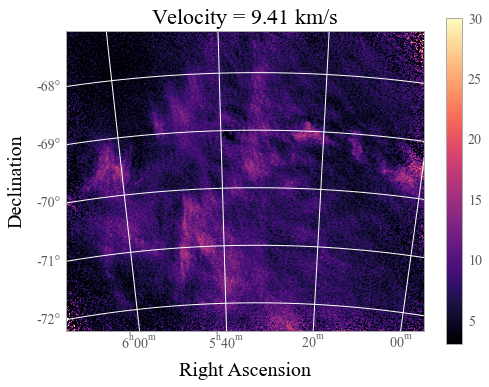

In [306]:
# structure beginning to enter in @ 9.41 km/s

get_im(get_v_index(9.41 * 10 **3), '$\mathregular{9.41}$', 'im_9.41.png', 3, 30, file)

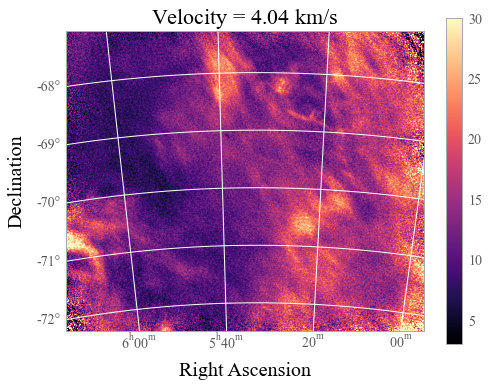

In [8]:
get_im(get_v_index(4.04 * 10 ** 3),'$\mathregular{4.04}$', 'im_4.04.png', 3, 30, file)

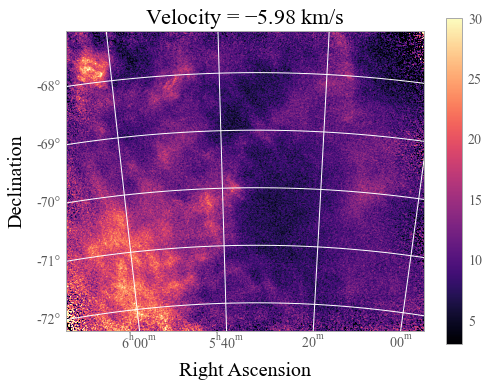

In [9]:
get_im(get_v_index(-5.98 * 10 ** 3),'$\mathregular{-5.98}$', 'im_-5.98.png', 3, 30, file)

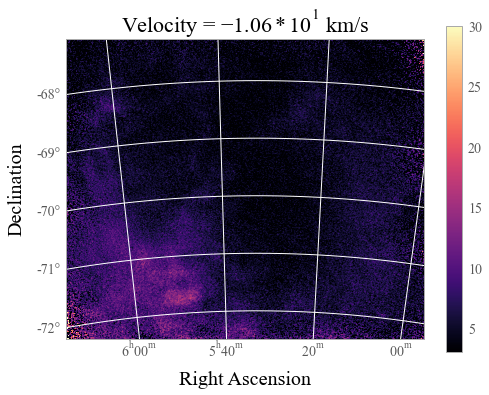

In [19]:
get_im(get_v_index(-1.06 * 10 ** 4), '$\mathregular{-1.06 * 10^1}$', 'im_-1.06.png', 3, 30, file)

# Creating column density plots (w/o FUSE data just yet)

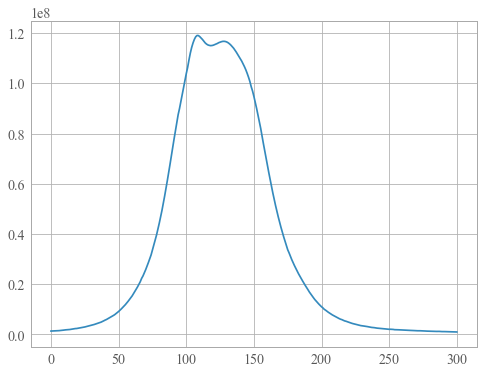

In [10]:
# plot of brightness intensity vs velocity
sum_data = np.sum(np.sum(file[0].data, axis = 1), axis = 1)
plt.plot(sum_data) 

In [11]:
tot_col_dens = 1.82 * (10 ** 18) * np.sum(file[0].data, axis = 0) * 0.244297870185 # in cm^-2, last val = velocity

In [471]:
print(len(tot_col_dens)) # y axis = rows
print(len(tot_col_dens[0])) # x axis = col

2681
3191


In [474]:
print(tot_col_dens[0][0])
print(tot_col_dens[2000][1550])

8.462762e+20
4.742147e+20


In [320]:
# function to plot column density given a range of velocities
def get_col_dens(file, file_name, v_min1, v_max1, title, subtitle, save, name):
    wcs = WCS(file[0].header)
    ax = plt.subplot(projection = wcs, slices = ['x','y',1], zorder = -1) # (slices isn't doing anything here)
    plt.grid(b = True, which = 'major', axis = 'both', linewidth = 1, color = 'white', zorder = -1)
    plt.xlabel('Right Ascension', fontname = 'Times New Roman', fontsize = 20)
    plt.ylabel('Declination', fontname = 'Times New Roman', fontsize = 20)
    plt.title(title, y = 1.06, fontname = 'Times New Roman', fontsize = 22)
    plt.suptitle(subtitle, x = 0.45, y = 0.9, fontsize = 12)
    plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['text.color'] = 'Black'
    plt.rcParams['font.size'] = '14'
    plt.imshow(file_name, cmap = 'magma', vmin = v_min1, vmax = v_max1, zorder = -1)
    plt.colorbar()
    
    if save == True: # saves figure
        plt.savefig(name, bbox_inches='tight')

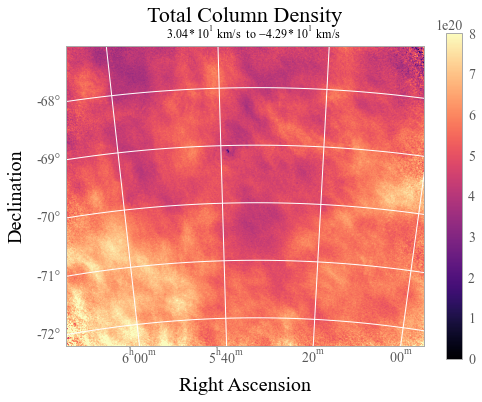

In [321]:
# column density over all the velocity ranges 

get_col_dens(file, tot_col_dens, -0.25 * 10 ** 19,  0.8 * 10 ** 21, 'Total Column Density', '$\mathregular{3.04 * 10^{1}}$ km/s  to $\mathregular{-4.29 * 10^{1}}$ km/s', True, 'LMC_cold_tot.png')


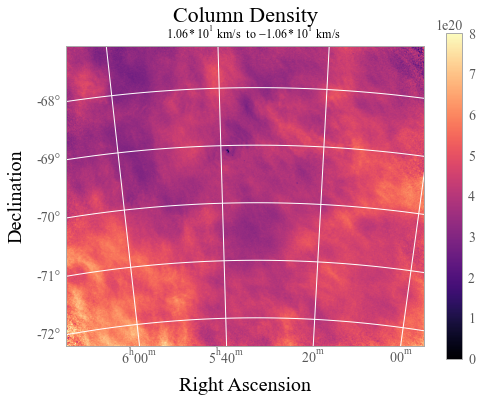

In [13]:
# column density over 1.06 * 10^1 km/s to -1.06 * 10^1 km/s 
# = approx range of velocities where structure enters, peaks, and dissipates

indx1 = get_v_index(1.06 * 10 ** 4)
indx2 = get_v_index(-1.06 * 10 ** 4)
col_dens1 = 1.82 * (10 ** 18) * np.sum(file[0].data[indx1:indx2], axis = 0) * 0.244297870185 
get_col_dens(file, col_dens1, -0.25 * 10 ** 19,  0.8 * 10 ** 21, 'Column Density', '$\mathregular{1.06 * 10^1}$ km/s  to $\mathregular{-1.06 * 10^1}$ km/s', False, 'no')

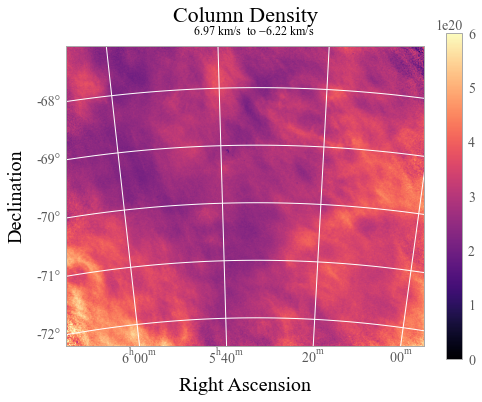

In [14]:
# column density over 6.97 km/s to -6.22 km/s 
# = range of velocities where structure peaks

indx3 = get_v_index(6.97 * 10 ** 3)
indx4 = get_v_index(-6.22 * 10 ** 3)
col_dens2 = 1.82 * (10 ** 18) * np.sum(file[0].data[indx3:indx4], axis = 0) * 0.244297870185 
get_col_dens(file, col_dens2, 0,  0.6 * 10 ** 21, 'Column Density', '$\mathregular{6.97}$ km/s  to $\mathregular{-6.22}$ km/s', False, 'no')

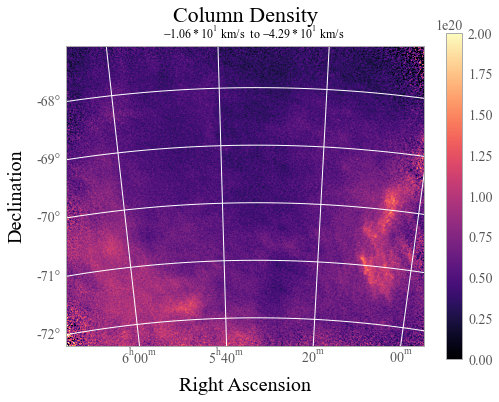

In [15]:
# column density over -10.6 km/s to -42.9 km/s 
# = range of velocities where structure dissipating/no longer present

indx5 = get_v_index(-1.06 * 10 ** 4)
indx6 = get_v_index(-4.29 * 10 ** 4)
col_dens3 = 1.82 * (10 ** 18) * np.sum(file[0].data[indx5:indx6], axis = 0) * 0.244297870185 
get_col_dens(file, col_dens3, 0, 2 * 10 ** 20, 'Column Density', '$\mathregular{-1.06 * 10^1}$ km/s  to $\mathregular{-4.29 * 10^1}$ km/s', False, 'no')

# Plotting FUSE data atop column density maps

In [16]:
# information from the absorption line data file

s_file = pd.read_csv('/Users/FRANNYPACK/Downloads/grind!/research/Data/FUSE_info (SMC + LMC).csv')

In [17]:
s_file

,Target,RA_FK5,DEC_FK5,Galaxy,SpecType,FUSE_ID,Short_ID,log10_N_MW
0,Sk-69_94,79.560542,-69.250278,LMC,A0e/LBV,Z9050201000,z90502,16.839883
1,HDE269599,82.094500,-69.142281,LMC,B,E9570301000,e95703,17.953637
2,HD38489,85.055833,-69.379500,LMC,B0,E9570501000,e95705,17.985449
3,Sk-65.01,73.527583,-65.589583,LMC,B0-1I,A0490302000,a04903,17.593783
4,BI184,82.627500,-71.042022,LMC,B0.5V,P2170301000,p21703,18.155617
...,...,...,...,...,...,...,...,...
156,AV81,12.681129,-73.451708,SMC,WN5h,P2170801000,p21708,16.859453
157,HD5980,14.860708,-72.164972,SMC,WN6LBV+WN4,F0490108000,p22301,16.331009
158,SK188,22.767625,-73.417278,SMC,WO4+O7III,A1230263000,a12302,17.594381
159,AV6,11.325833,-73.256500,SMC,,P2210101000,p22101,16.954417


In [18]:
FUSE_data = s_file[(s_file["DEC_FK5"] < -67.5) & (s_file["Galaxy"] == 'LMC') & (s_file["RA_FK5"] > 75)]
print(FUSE_data)

             Target     RA_FK5    DEC_FK5 Galaxy     SpecType      FUSE_ID  \
0          Sk-69_94  79.560542 -69.250278    LMC      A0e/LBV  Z9050201000   
1         HDE269599  82.094500 -69.142281    LMC            B  E9570301000   
2           HD38489  85.055833 -69.379500    LMC           B0  E9570501000   
4             BI184  82.627500 -71.042022    LMC        B0.5V  P2170301000   
6          SK-69D59  75.803292 -69.027000    LMC         B0Ia  P1031103000   
7          SK-68D52  76.835833 -68.536000    LMC         B0Ia  P1174001000   
8      MACHO79-4779  77.371250 -68.917500    LMC          B0V  C1030301000   
9      MACHO78-6097  79.519583 -69.805278    LMC          B0V  C1030101000   
10           HV2274  75.670667 -68.405917    LMC      B1.5III  B0770201000   
11        Sk-69-237  84.505625 -69.370472    LMC         B1Ia  B1280701000   
12            HV982  82.468750 -69.156111    LMC          B1V  C1030201000   
15          HD38029  84.233333 -69.193333    LMC            O  P

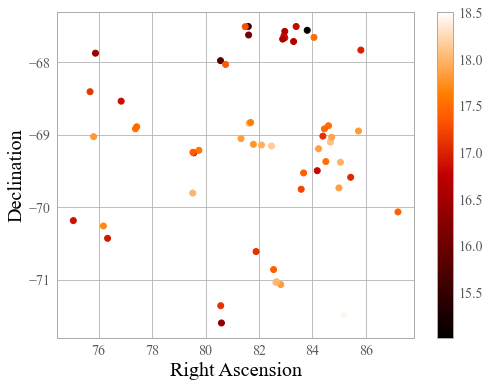

In [138]:
# graph of absorption line data as a function of sky position

x_col = FUSE_data['RA_FK5']
y_col = FUSE_data['DEC_FK5']
brightness = FUSE_data['log10_N_MW']
def s_graph():
    plt.scatter(x, y, marker = 'o', c = brightness, zorder = 1)
    plt.colorbar()
    plt.xlabel('Right Ascension', fontname = 'Times New Roman', fontsize = 20)
    plt.ylabel('Declination', fontname = 'Times New Roman', fontsize = 20)
    plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['text.color'] = 'Black'
    plt.rcParams['font.size'] = '14'
    
s_graph()

In [20]:
# make 2D header 
def make_flat_hdr(file):
    hdr = file[0].header
    
    # Make a 2D header 
    flathdr = fits.Header()
    flathdr["NAXIS   "] = 2
    flathdr["NAXIS1  "] = hdr["NAXIS1  "]
    flathdr["NAXIS2  "] = hdr["NAXIS2  "]
    flathdr["CRPIX1  "] = hdr["CRPIX1  "]
    flathdr["CRPIX2  "] = hdr["CRPIX2  "]
    flathdr["CRVAL1  "] = hdr["CRVAL1  "]
    flathdr["CRVAL2  "] = hdr["CRVAL2  "]
    flathdr["CDELT1  "] = hdr["CDELT1  "]
    flathdr["CDELT2  "] = hdr["CDELT2  "]
    flathdr["CTYPE1  "] = hdr["CTYPE1  "]
    flathdr["CTYPE2  "] = hdr["CTYPE2  "]
    flathdr["LONPOLE "] = hdr["LONPOLE "]
    flathdr["LATPOLE "] = hdr["LATPOLE "]
    
    return flathdr

In [21]:
file_flat_hdr = make_flat_hdr(file)

In [117]:
# creates grid of (ra, dec) values corresponding to each pixel
def coordinate_4_pix(flat_hdr): 
    NAXIS1 = flat_hdr["NAXIS1"]
    NAXIS2 = flat_hdr["NAXIS2"]
    x = np.arange(NAXIS1)
    y = np.arange(NAXIS2)
    X, Y = np.meshgrid(x, y) # return coordinate matrices from coordinate vectors
    w = WCS(flat_hdr)
    ra, dec = w.wcs_pix2world(X, Y, 0)# turns pixel coordinates into world coordinates
    coords = np.dstack((ra,dec)) # stack arrays in sequence along 3rd axis
    return coords

In [139]:
coords_col = coordinate_4_pix(file_flat_hdr)

In [585]:
# function to plot the absorption line data on top of specific channel maps
def chan_map_abs_plt(coordinates, cube, subtitle, vmin_val, vmax_val, color, save_fig, name):
    fig = plt.figure(figsize = (10,7))
    image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)
    plt.xlim(94, 73.5)
    plt.ylim(-72.5, -67)
    scatter_pts = plt.scatter(x_col, y_col, c = brightness, cmap = color)
    plt.colorbar(scatter_pts, label='N(H$_2$)')
    plt.colorbar(image)
    plt.xlabel('Right Ascension', fontname = 'Times New Roman', fontsize = 20)
    plt.ylabel('Declination', fontname = 'Times New Roman', fontsize = 20)
    plt.title('Absorption Line Measurements on $N_H$ Map', y = 1.06, fontname = 'Times New Roman', fontsize = 22)
    plt.suptitle(subtitle, x = 0.36, y = 0.93, fontsize = 14)
    
    if save_fig == True:
        plt.savefig(name, bbox_inches='tight')
    

/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


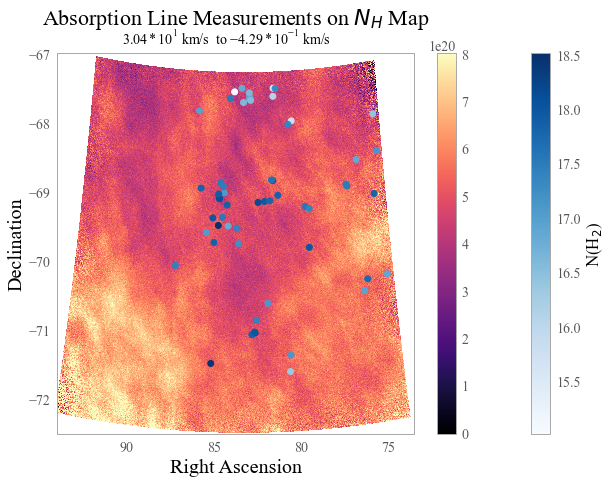

In [586]:
# plots abs line data atop of ALL data
# note that this graph is the column density graph but reflected over the y-axis

chan_map_abs_plt(coords_col, tot_col_dens, '$\mathregular{3.04 * 10^{1}}$ km/s  to $\mathregular{-4.29 * 10^{-1}}$ km/s', -0.25 * 10 ** 19, 0.8 * 10 ** 21, 'Blues', False, 'testfig.png')


/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


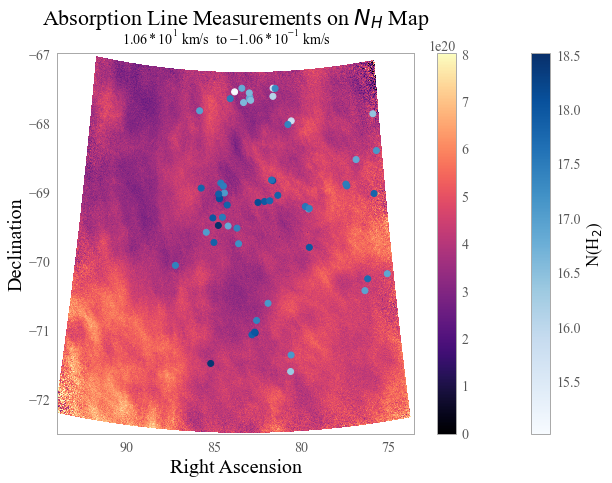

In [589]:
# plots abs line data atop of channel map from v = 10.6 km/s to -1.06 * 10^-1 km/s
chan_map_abs_plt(coords_col, col_dens1, '$\mathregular{1.06 * 10^{1}}$ km/s  to $\mathregular{-1.06 * 10^{-1}}$ km/s', -0.25 * 10 ** 19, 0.8 * 10 ** 21, 'Blues', False, 'no')

/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


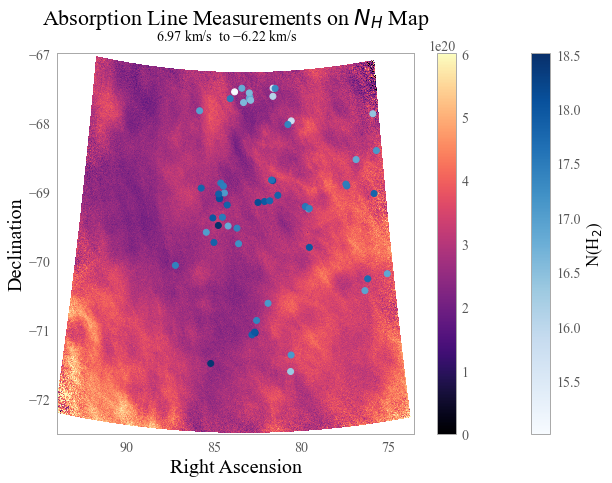

In [590]:
#plots abs line data atop on channel map from v = 6.97 km/s to -6.22 km/s
chan_map_abs_plt(coords_col, col_dens2, '$\mathregular{6.97}$ km/s  to $\mathregular{-6.22}$ km/s', 0, 6 * 10 ** 20, 'Blues', False, 'no')


/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


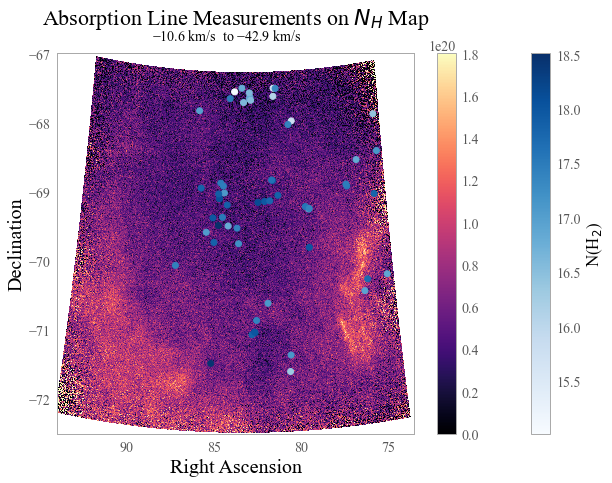

In [591]:
#plots abs line data atop on channel map from v = 10.6 km/s to -42.9 km/s
chan_map_abs_plt(coords_col, col_dens3, '$\mathregular{-10.6}$ km/s  to $\mathregular{-42.9}$ km/s', 0, 1.8 * 10 ** 20, 'Blues', False, 'no')


# Plotting HI VS H2 data

[79.560542 82.0945 85.05583299999999 82.6275 75.8032916667 76.835833
 77.37125 79.519583 75.67066700000001 84.505625 82.46875 84.233333
 84.39370799999999 83.672083 84.67541700000001 83.80799999999999 84.603208
 81.601042 84.061167 81.611042 82.8147916667 82.934625 82.9665833333
 76.1705833333 76.3280416667 85.1805 87.2073333333 81.8905833333
 79.7482083333 80.56616700000001 80.559167 85.8165 79.52525 82.967083
 85.72875 75.874 81.792 83.3921666667 75.04320799999999 85.43625
 81.3265416667 84.995446 81.4848333333 82.547292 84.182625
 80.74945799999999 84.4525 83.5807916667 81.626333 82.661542 83.297083
 82.88708299999999 77.419 84.677375 80.59375 84.7229166667 84.7427083333
 81.6887916667]


[-69.25027800000001 -69.14228100000001 -69.3795 -71.042022 -69.027 -68.536
 -68.9175 -69.805278 -68.405917 -69.37047199999999 -69.156111 -69.193333
 -69.019389 -69.5275 -69.098528 -67.5575 -68.875778 -67.504778 -67.655361
 -67.62230600000001 -71.0691388889 -67.6335 -67.6614166667 -70.2595833333
 -7

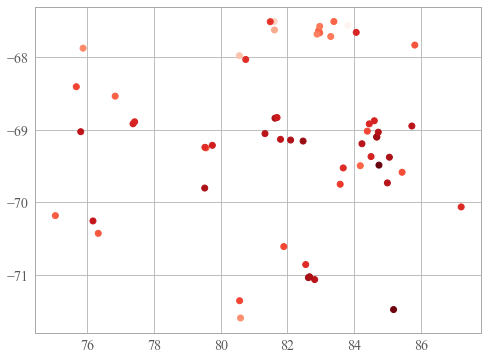

In [588]:
# grab pixel associated with location of each absorption line 

scatter_pts = plt.scatter(x, y, c = brightness, cmap = 'Reds')
ra_vals = scatter_pts.get_offsets()[:,0] # gets RA vals
dec_vals = scatter_pts.get_offsets()[:,1] # gets dec vals

print(ra_vals)
print("\n")
print(dec_vals)

In [587]:
# gives pix vals associated w RA/DEC vals using FITS header

def get_pix_vals(flat_FITS_hdr):
    wcs = WCS(flat_FITS_hdr)
    pix_arr = []
    x_pix = []
    y_pix = []
    for i in range(0, len(ra_vals)):
        arr = []
        x_pix, y_pix = wcs.all_world2pix(ra_vals[i], dec_vals[i], 0)
        arr.append(x_pix)
        arr.append(y_pix)
        pix_arr.append(arr)
    
    return pix_arr

In [473]:
print(np.max(pix_arr)) # max of values from the y axis
print(np.max(pix_arr[0])) # max of values from the x axis

3131.5982314335606
2372.9887605293443


In [592]:
# gives arr of H1 col densities given the pixels with which the background stars corresponded to 
# this seems to be right
def col_dens_arr(pix_arr, col_dens_vals):
    HI_col_dens = []
    HI_col_dens_nolog = [] # array of the col dens w/o a logarithmic function applied to it
    for i in range(0, len(pix_arr)):
        # RA values = 0, Dec = 1 BUT the rows in col_dens_vals = y-values, cols = x-values
        col_dens = col_dens_vals[int(pix_arr[i][1])][int(pix_arr[i][0])] 
        # so the values are logarithmic (to match H2 col dens) and in cm^-2
        HI_col_dens_nolog.append(col_dens)
        HI_col_dens.append(np.log10(col_dens))
    

    print(HI_col_dens)
    print('\n')
    print(len(HI_col_dens))
    print('\n')
    print(HI_col_dens_nolog)
    print('\n')
    print(min(HI_col_dens_nolog), max(HI_col_dens_nolog))
    print(np.log10(min(HI_col_dens_nolog)), np.log10(max(HI_col_dens_nolog)))
    
    return HI_col_dens

In [593]:
# plot of HI col dens VS H2 col dens

def HI_H2_plt(HI_col_dens, x_range, y_range, v_range):
    H2_col_dens = FUSE_data['log10_N_MW']
    scat = plt.scatter(H2_col_dens, HI_col_dens, zorder = 1)
    plt.xticks(x_range)
    plt.yticks(y_range) 
    plt.grid(color = 'black', linestyle = '--', linewidth = 0.7, zorder = -1)
    plt.xlabel('log$_{10}$(N$_{H2}$) [cm$^{-2}$]')
    plt.ylabel('log$_{10}$(N$_{HI}$) [cm$^{-2}$]')
    plt.title('HI Column Density VS H$_2$ Column Density', y = 1.1, x = 0.5)
    plt.suptitle(v_range, y = .96, x = 0.5)
    return scat.get_offsets(), scat

In [594]:
# get coords of pts on scatter plot

def HI_H2_plt_coords(HI_col_dens):
    H2_col_dens = FUSE_data['log10_N_MW']
    plot = plt.scatter(H2_col_dens, HI_col_dens)
    coords = plot.get_offsets()
    x = []
    y = []
    for i in range(len(coords)):
        x.append(coords[i][0])
        y.append(coords[i][1])
    
    return x, y

In [595]:
def line_of_best_fit(HI, x, y): 
    slope, intercept = np.polyfit(x, y, 1)
    y_vals = [] 
    for i in range(len(x)):
        y_vals.append((x[i] * slope) + intercept)
        
    plt.plot(x, y_vals)
    print("Slope: " + str(slope))

In [596]:
# removes outliers from plot

def remove_vals(coords, y_val):
    new_coords = []
    for i in range(len(coords)):
        if coords[i][1] > y_val:
            temp_coords = coords[i]
            new_coords.append(temp_coords)
    return new_coords

In [597]:
# creates separate arrays of x and y pixel coordinates

def sep_xy_vals(pix_arr):
    x_pix = []
    y_pix = []
    for i in range(0, len(pix_arr)):
        x_pix.append(float((pix_arr[i][0])))
        y_pix.append(float((pix_arr[i][1])))

    return x_pix, y_pix

In [598]:
# function to plot the absorption line data on top of specific channel maps
def chan_map_abs_subplt(coordinates, cube, subtitle, vmin_val, vmax_val, color, save_fig, name):
    fig = plt.figure(figsize = (5,4))
    image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma')
    plt.xlim(94, 73.5)
    plt.ylim(-72.5, -67)
    scatter_pts = plt.scatter(x_col, y_col, c = brightness, cmap = color)
    plt.colorbar(scatter_pts, label='N(H$_2$)')
    plt.colorbar(image)
    plt.xlabel('Right Ascension', fontname = 'Times New Roman', fontsize = 20)
    plt.ylabel('Declination', fontname = 'Times New Roman', fontsize = 20)
    #plt.title('Absorption Line Measurements on $N_H$ Map', y = 1.06, fontname = 'Times New Roman', fontsize = 22)
    #plt.suptitle(subtitle, x = 0.36, y = 0.93, fontsize = 14)
    
    if save_fig == True:
        plt.savefig(name, bbox_inches='tight')
    

In [599]:
# gets HI col dens values over entire range of velocities 

pix_arr = get_pix_vals(file_flat_hdr)
x_ran = np.arange(15, 19, 0.5)
y_ran_tot = np.arange(20.45, 20.85, 0.05)
HI_cd_arr_tot = col_dens_arr(pix_arr, tot_col_dens)

[20.70402, 20.669899, 20.671349, 20.686323, 20.7924, 20.646965, 20.746473, 20.71573, 20.72298, 20.682983, 20.721066, 20.67058, 20.62368, 20.650179, 20.462814, 20.627768, 20.6759, 20.631214, 20.731445, 20.64587, 20.69738, 20.66501, 20.635717, 20.719225, 20.747204, 20.723593, 20.68168, 20.71344, 20.707342, 20.748705, 20.677145, 20.671724, 20.675453, 20.689613, 20.733479, 20.757212, 20.6957, 20.769178, 20.81589, 20.707952, 20.710772, 20.69592, 20.617008, 20.689163, 20.677404, 20.643255, 20.699482, 20.649988, 20.760317, 20.728088, 20.591015, 20.61109, 20.74993, 20.487942, 20.716928, 20.602383, 20.73058, 20.701208]


58


[5.0584688e+20, 4.6762648e+20, 4.6919078e+20, 4.856499e+20, 6.2001126e+20, 4.435738e+20, 5.577932e+20, 5.196747e+20, 5.284205e+20, 4.819284e+20, 5.2609777e+20, 4.6835944e+20, 4.204176e+20, 4.468676e+20, 2.9027835e+20, 4.2439175e+20, 4.7413186e+20, 4.2777455e+20, 5.388217e+20, 4.4245572e+20, 4.98172e+20, 4.6239295e+20, 4.3223273e+20, 5.238715e+20, 5.587328e+20, 5.2916722e+2

# DEBUGGING AND CHECKING WHETHER PIXEL VALUES ARE CORRECT

In [600]:
# getting target points

# minimum value for DEC occurs at 98th index
print(np.min(FUSE_data['DEC_FK5']))
x_test1 = FUSE_data['RA_FK5'][98]
y_test1 = FUSE_data['DEC_FK5'][98]
print(x_test, y_test)

# max value for DEC @ 23rd index
print(np.max(FUSE_data['DEC_FK5']))
x_test2 = FUSE_data['RA_FK5'][23]
y_test2 = FUSE_data['DEC_FK5'][23]
print(x_test2, y_test2)

x_test = [x_test1, x_test2]
y_test = [y_test1, y_test2]
print(x_test, y_test)

-71.59944399999999
[80.59375, 81.601042] [-71.59944399999999, -67.504778]
-67.504778
81.601042 -67.504778
[80.59375, 81.601042] [-71.59944399999999, -67.504778]


In [601]:
# function to plot 1 star on top of channel maps
def chan_map_abs_plt_test(coordinates, cube, subtitle, vmin_val, vmax_val, x_test_val, y_test_val):
    fig = plt.figure(figsize = (10,7))
    image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma')
    plt.xlim(73.5, 94)
    plt.ylim(-72.5, -67)
    scatter_pts = plt.scatter(x_test_val, y_test_val)
    plt.colorbar(scatter_pts, label='N(H$_2$)')
    plt.colorbar(image)
    plt.xlabel('Right Ascension', fontname = 'Times New Roman', fontsize = 20)
    plt.ylabel('Declination', fontname = 'Times New Roman', fontsize = 20)
    plt.title('Absorption Line Measurements on $N_H$ Map', y = 1.06, fontname = 'Times New Roman', fontsize = 22)
    plt.suptitle(subtitle, x = 0.36, y = 0.93, fontsize = 14)
    

In [602]:
# gives pix vals associated w RA/DEC vals using FITS header

def get_pix_vals_test(flat_FITS_hdr, x_test_val, y_test_val):
    wcs = WCS(flat_FITS_hdr)
    pix_arr = []
    arr = []
    x_pix, y_pix = wcs.all_world2pix(x_test_val, y_test_val, 0)
    arr.append(x_pix)
    print(arr)
    arr.append(y_pix)
    pix_arr.append(arr)
    
    return pix_arr

In [603]:
pix_arr_test = get_pix_vals_test(file_flat_hdr, x_test, y_test)
print(pix_arr_test)

[array([2132.25118157, 2025.65423158])]
[[array([2132.25118157, 2025.65423158]), array([ 446.0414459 , 2556.39311369])]]


In [604]:
print(pix_arr)

# RA values are [:, 1]
# Dec values are [:, 0]

[[array(2372.98876053), array(1643.10503615)], [array(1912.78895498), array(1716.96164346)], [array(1374.19930441), array(1592.14490723)], [array(1805.20402339), array(741.47957004)], [array(3068.13186419), array(1694.71045186)], [array(2905.75822162), array(1967.33061116)], [array(2786.85024212), array(1782.20258985)], [array(2363.03283276), array(1357.76106518)], [array(3131.59823143), array(2008.62027039)], [array(1473.72160818), array(1599.28401341)], [array(1844.17895547), array(1710.93888434)], [array(1521.58963206), array(1691.27169304)], [array(1490.63057441), array(1780.19532202)], [array(1625.29342295), array(1520.60371328)], [array(1439.71422789), array(1738.41947491)], [array(1591.68341666), array(2533.19210311)], [array(1450.43586004), array(1853.23668865)], [array(2025.65423158), array(2556.39311369)], [array(1542.64008912), array(2482.35023418)], [array(2022.08829952), array(2496.07312824)], [array(1773.81252403), array(727.80892869)], [array(1762.95291678), array(2494.4

In [605]:
# colors in pixels in square shape on figure
def color_pix(arr, ra, dec):
    # switched the ra & dec values b/c when it is "imshowed", the row values turn in the y-values, 
    # and the col values turn into the x-values
    arr[dec][ra] = 20 
    for j in range(50):
        for k in range(50):
            if (ra != 2132 & ra != 2025): # the RA values of our 2 target points
                arr[dec - k][ra - j] = 20
            else:
                arr[dec - k][ra - j] = 40

/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3782587029.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma')


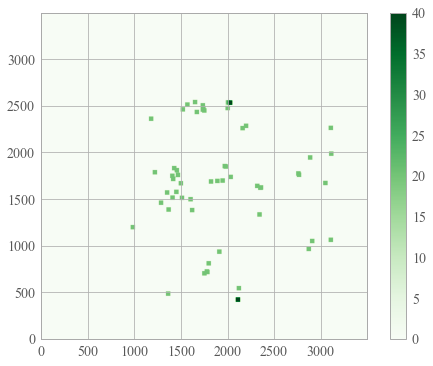

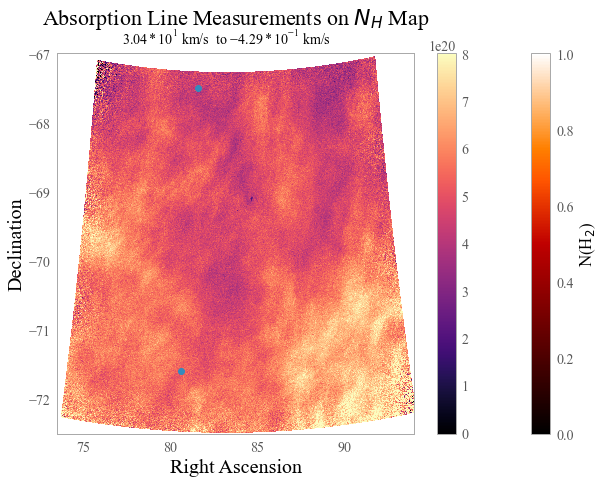

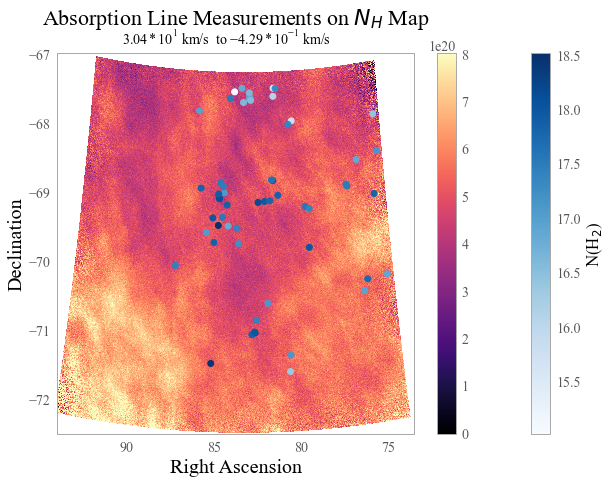

In [606]:
arr = np.zeros((3500, 3500))

for i in range(len(pix_arr)):
    # pix_arr[i][0] gives the pixel associated with the RA value
    # pix_arr[i][1] gives the pixel associated with the Dec value
    
    ra = int(pix_arr[i][0])
    dec = int(pix_arr[i][1])
    
    color_pix(arr, ra, dec)
    
green_fig = plt.imshow(arr, cmap = 'Greens', origin = 'lower')
#plt.savefig('Greens.png')
plt.colorbar()

chan_map_abs_plt_test(coords_col, tot_col_dens, '$\mathregular{3.04 * 10^{1}}$ km/s  to $\mathregular{-4.29 * 10^{-1}}$ km/s', -0.25 * 10 ** 19, 0.8 * 10 ** 21, x_test, y_test)
chan_map_abs_plt(coords_col, tot_col_dens, '$\mathregular{3.04 * 10^{1}}$ km/s  to $\mathregular{-4.29 * 10^{-1}}$ km/s', -0.25 * 10 ** 19, 0.8 * 10 ** 21, 'Blues', False, 'testfig.png')



# DEBUGGING OVER! Here are the column density plots

Slope: 0.020778958880060566


/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


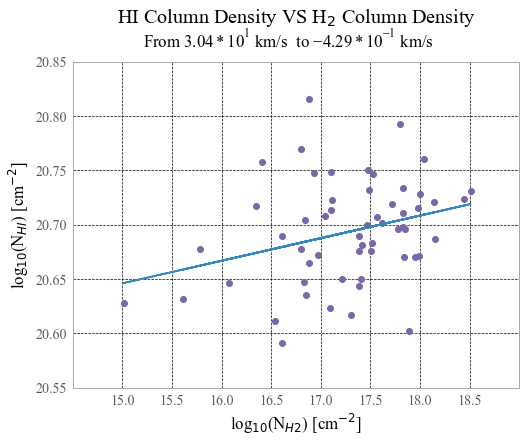

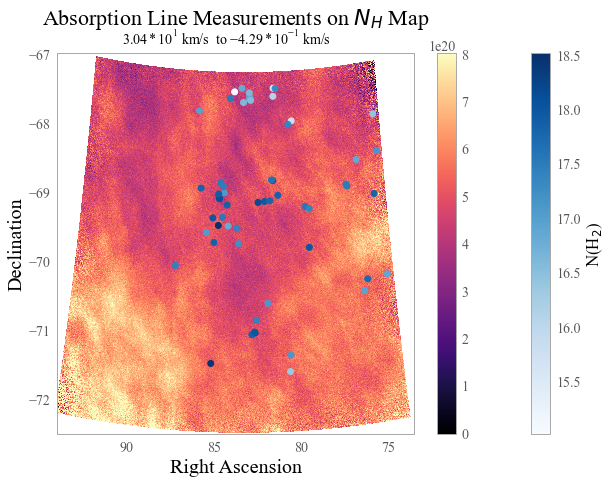

In [607]:
# integrated over entire range of velocities
# really good amount of correlation!

coords, plot = HI_H2_plt(HI_cd_arr_tot, x_ran, y_ran_tot, 'From $\mathregular{3.04 * 10^{1}}$ km/s  to $\mathregular{-4.29 * 10^{-1}}$ km/s')
plot.remove()
coords = remove_vals(coords, 20.50)
new_x, new_y = sep_xy_vals(coords)
plt.scatter(new_x, new_y)

# adding line of best fit
line_of_best_fit(HI_cd_arr_tot, new_x, new_y)
plt.xlim(14.5, 19)
plt.ylim(20.55, 20.85)

chan_map_abs_plt(coords_col, tot_col_dens, '$\mathregular{3.04 * 10^{1}}$ km/s  to $\mathregular{-4.29 * 10^{-1}}$ km/s', -0.25 * 10 ** 19, 0.8 * 10 ** 21, 'Blues', False, 'testfig.png')


In [608]:
HI_cd_arr1 = col_dens_arr(pix_arr, col_dens1)
y_ran1 = np.arange(20.45, 20.7, 0.05)

[20.613907, 20.608442, 20.596865, 20.563982, 20.68828, 20.616001, 20.677853, 20.636858, 20.662542, 20.587307, 20.622393, 20.564085, 20.52563, 20.603691, 20.275019, 20.548246, 20.562557, 20.568937, 20.619019, 20.559273, 20.563627, 20.5671, 20.558174, 20.657396, 20.664072, 20.611794, 20.540657, 20.579044, 20.6095, 20.664736, 20.614588, 20.545996, 20.624332, 20.56064, 20.601946, 20.58776, 20.615711, 20.637411, 20.692282, 20.6007, 20.636692, 20.589094, 20.544662, 20.608648, 20.560835, 20.60139, 20.558784, 20.557886, 20.652044, 20.61863, 20.535828, 20.576666, 20.682846, 20.315222, 20.60653, 20.504675, 20.641914, 20.629309]


58


[4.1106138e+20, 4.0592182e+20, 3.952427e+20, 3.664222e+20, 4.8784335e+20, 4.1304905e+20, 4.7626907e+20, 4.3336834e+20, 4.597715e+20, 3.8663955e+20, 4.191724e+20, 3.665092e+20, 3.354526e+20, 4.015053e+20, 1.8837338e+20, 3.5338367e+20, 3.6522166e+20, 3.70627e+20, 4.159283e+20, 3.624711e+20, 3.6612284e+20, 3.690627e+20, 3.6155517e+20, 4.54356e+20, 4.6139452e+20, 4.090

Slope: 0.015852720723173893


(20.5, 20.7)

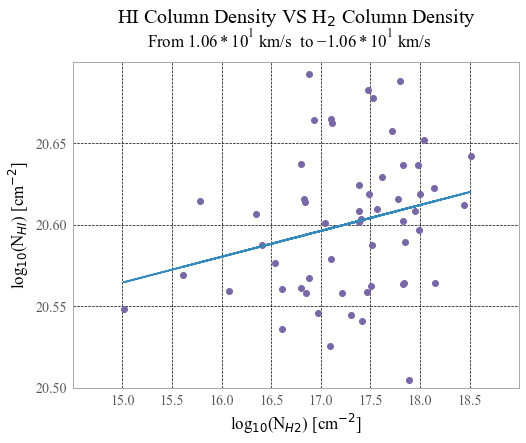

In [609]:
# over range of velocities where structure enters, peaks, then dissipates
# good amount of upwards correlation

coords2, plot2 = HI_H2_plt(HI_cd_arr1, x_ran, y_ran1, 'From $\mathregular{1.06 * 10^{1}}$ km/s  to $\mathregular{-1.06 * 10^{1}}$ km/s')
plot2.remove()
coords2 = remove_vals(coords2, 20.50)
new_x2, new_y2 = sep_xy_vals(coords2)
plt.scatter(new_x2, new_y2)

line_of_best_fit(HI_cd_arr1, new_x2, new_y2)
plt.xlim(14.5, 19)
plt.ylim(20.5, 20.7)

In [610]:
HI_cd_arr2 = col_dens_arr(pix_arr, col_dens2)
y_ran2 = np.arange(20.3, 20.65, 0.05)

[20.465555, 20.47338, 20.474651, 20.404205, 20.582102, 20.50382, 20.558956, 20.540125, 20.565298, 20.47169, 20.48184, 20.428696, 20.407524, 20.454992, 20.340618, 20.427954, 20.4085, 20.423038, 20.49617, 20.394243, 20.395727, 20.442501, 20.417238, 20.551132, 20.540873, 20.42048, 20.35516, 20.446901, 20.470388, 20.533329, 20.480322, 20.413284, 20.484781, 20.416313, 20.459719, 20.487581, 20.48623, 20.470594, 20.603077, 20.458021, 20.472034, 20.419376, 20.391542, 20.475698, 20.424253, 20.42808, 20.428368, 20.40563, 20.514416, 20.45599, 20.385254, 20.42983, 20.549267, 20.35741, 20.488106, 20.405876, 20.490368, 20.494215]


58


[2.9211582e+20, 2.974263e+20, 2.982992e+20, 2.5363223e+20, 3.8203332e+20, 3.190222e+20, 3.6220675e+20, 3.468366e+20, 3.6753377e+20, 2.962712e+20, 3.0327687e+20, 2.6834665e+20, 2.5557863e+20, 2.85097e+20, 2.1908782e+20, 2.6788829e+20, 2.5615335e+20, 2.6487344e+20, 3.1345145e+20, 2.4788138e+20, 2.4872893e+20, 2.770131e+20, 2.6135933e+20, 3.5573983e+20, 3.4743463e+20, 2

Slope: 0.0040495698150388275


(20.3, 20.65)

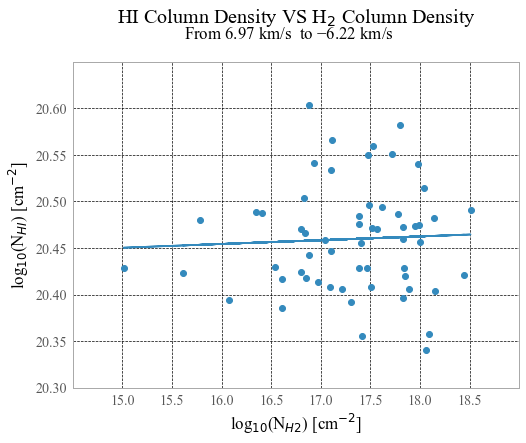

In [611]:
# over range of velocities where structure peaks!
# oddly - there is not much upwards correlation here

coords3, plot3 = HI_H2_plt(HI_cd_arr2, x_ran, y_ran2, 'From $\mathregular{6.97}$ km/s  to $\mathregular{-6.22}$ km/s')
new_x3, new_y3 = sep_xy_vals(coords3)

line_of_best_fit(HI_cd_arr2, new_x3, new_y3)
plt.xlim(14.5, 19)
plt.ylim(20.3, 20.65)

In [612]:
HI_cd_arr3 = col_dens_arr(pix_arr, col_dens3)
y_ran3 = np.arange(19.2, 20.15, 0.05)

[19.865772, 19.591703, 19.442804, 19.755507, 19.978886, 19.377823, 19.63876, 19.695387, 19.748327, 19.619898, 19.740196, 19.675146, 19.391275, 19.377676, 19.708555, 19.29267, 19.633747, 19.52896, 19.861053, 19.61709, 20.010813, 19.770409, 19.321388, 19.67236, 19.846733, 19.89575, 19.744835, 19.973038, 19.77639, 19.73154, 19.485043, 19.770336, 19.428762, 19.752785, 19.810873, 20.11407, 19.496216, 19.87348, 19.970123, 19.653294, 19.480865, 19.718529, 19.64374, 19.673777, 19.755962, 19.3733, 19.884602, 19.679361, 19.938053, 19.784084, nan, 19.235231, 19.819054, 19.73435, 19.689484, 19.683928, 19.864237, 19.63529]


58


[7.341295e+19, 3.905739e+19, 2.7720685e+19, 5.6951567e+19, 9.525449e+19, 2.386833e+19, 4.3527066e+19, 4.9589127e+19, 5.6017857e+19, 4.167706e+19, 5.4978915e+19, 4.7331033e+19, 2.4619275e+19, 2.3860256e+19, 5.1115697e+19, 1.9618643e+19, 4.3027567e+19, 3.3803385e+19, 7.2619563e+19, 4.140853e+19, 1.0252092e+20, 5.8939897e+19, 2.095989e+19, 4.702839e+19, 7.026401e+19, 7.865925

/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/740281327.py:11: RuntimeWarning: invalid value encountered in log10
  HI_col_dens.append(np.log10(col_dens))
/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/740281327.py:21: RuntimeWarning: invalid value encountered in log10
  print(np.log10(min(HI_col_dens_nolog)), np.log10(max(HI_col_dens_nolog)))


Slope: 0.07828430003010733


/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/1356406821.py:7: UserWarning: Warning: converting a masked element to nan.
  x_pix.append(float((pix_arr[i][0])))
/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/1356406821.py:8: UserWarning: Warning: converting a masked element to nan.
  y_pix.append(float((pix_arr[i][1])))


(19.2, 20.15)

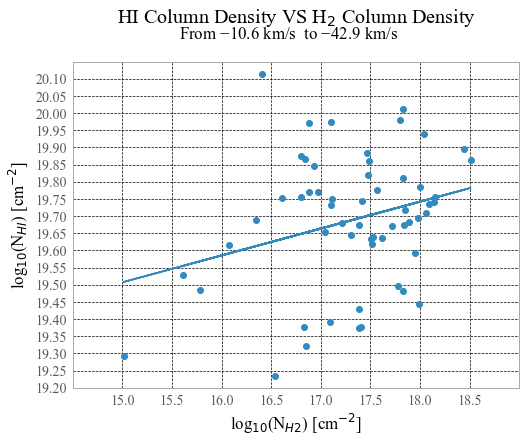

In [613]:
# over -10.6 km/s to -42.9 km/s 
# = range of velocities where structure dissipating/no longer present

coords4, plot4 = HI_H2_plt(HI_cd_arr3, x_ran, y_ran3, 'From $\mathregular{-10.6}$ km/s  to $\mathregular{-42.9}$ km/s')
new_x4, new_y4 = sep_xy_vals(coords4)
new_x4 = np.array(new_x4)
new_x4[np.isnan(new_x4)] = 0
new_y4 = np.array(new_y4)
new_y4[np.isnan(new_y4)] = 0
new_x4 = np.delete(new_x4, 50, axis = 0)
new_y4 = np.delete(new_y4, 50, axis = 0)

line_of_best_fit(HI_cd_arr3, new_x4, new_y4)
plt.xlim(14.5, 19)
plt.ylim(19.2, 20.15)


# EVERYTHING BELOW IS USING THE NON-MW-FOREGROUND LMC CUBE (aka the regular one)

In [300]:
file2 = fits.open('/Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_30Dor (NOT MW_FG)/the actual cube!.fits')
file2.info()
file2[0].header

Filename: /Users/FRANNYPACK/Downloads/grind!/research/Data/LMC_30Dor (NOT MW_FG)/the actual cube!.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU   86481   (3191, 2681, 636)   float32   


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 3191                                                  
NAXIS2  =                 2681                                                  
NAXIS3  =                  636                                                  
BUNIT   = 'K       '  /                                                         
DATE-OBS= '2021-10-27T16:16:57.5'  /                                            
TELESCOP= 'ASKAP   '  /                                                         
CRPIX1  =    1.70200000000E+03  /                                               
CDELT1  =   -1.94444444444E-03  /                                               
CRVAL1  =    8.32511958333E+01  /                                               
CTYPE1  = 'RA---SIN'  /     

# Obtaining images of the gas at specific velocities

In [303]:
# for getting the index of a specific velocity

def get_v_index2(v_val): #v_val must be in m/s
    v_index = int((v_val - (3.38236188219 * 10 ** 5)) / (-2.44211877318 * 10 ** 2)) + 1
    return v_index

get_v_index2(2.865 * 10 ** 5)

212

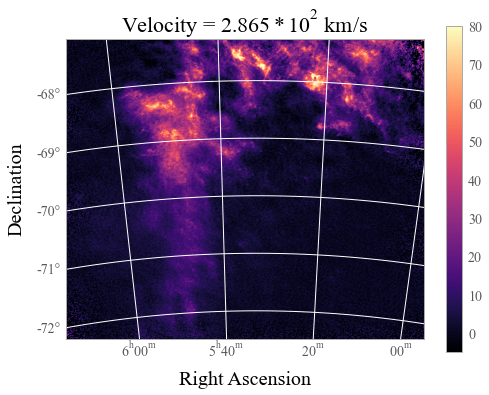

In [315]:
# requires much wider range of velocities to display image nicely
# v = 2.865 * 10 ** 2 km/s
# structure beginning to appear

get_im(get_v_index2(2.865 * 10 ** 5), '$\mathregular{2.865 * 10^2}$', 'im_2.865.png', -5, 80, file2)

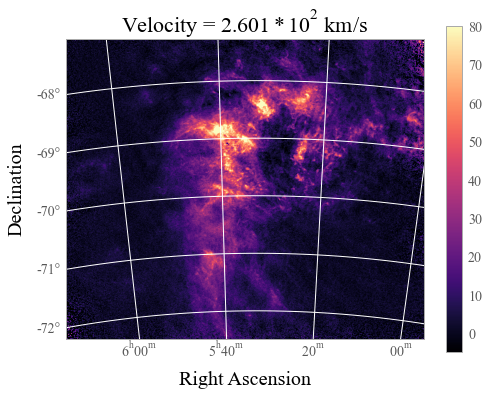

In [316]:
# requires much wider range of velocities to display image nicely
# v = 2.601 * 10 ** 2 km/s
# structure has accumulated into a circle!

get_im(get_v_index2(2.601 * 10 ** 5), '$\mathregular{2.601 * 10^2}$', 'im_2.601.png', -5, 80, file2)

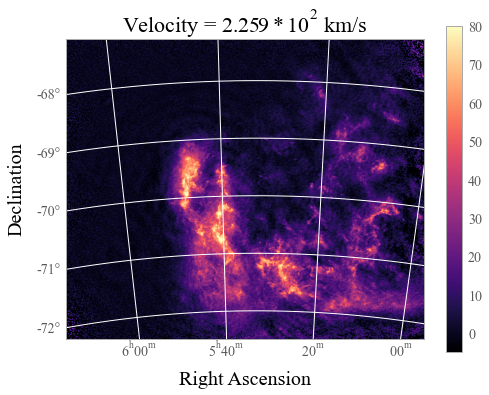

In [317]:
# requires much wider range of velocities to display image nicely
# v = 2.259 * 10 ** 2 km/s
# structure has accumulated lower bottom right!

get_im(get_v_index2(2.259 * 10 ** 5), '$\mathregular{2.259 * 10^2}$', 'im_2.259.png', -5, 80, file2)

In [318]:
# unlike the LMC foreground cube - there is no velocity where there is much HI filling entire scope of GASKAP!

# Creating Column Density Plots (w/o FUSE yet)

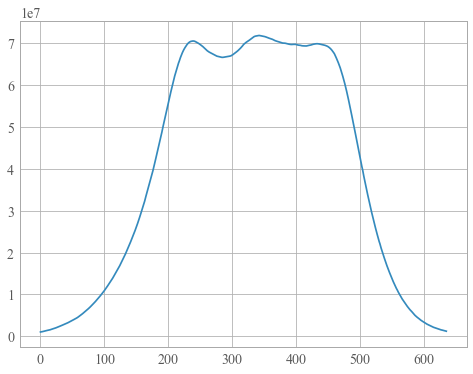

In [319]:
# plot of brightness intensity vs velocity
sum_data2 = np.sum(np.sum(file2[0].data, axis = 1), axis = 1)
plt.plot(sum_data2) 

In [322]:
tot_col_dens2 = 1.82 * (10 ** 18) * np.sum(file2[0].data, axis = 0) * 0.244211877318 # in cm^-2, last val = velocity

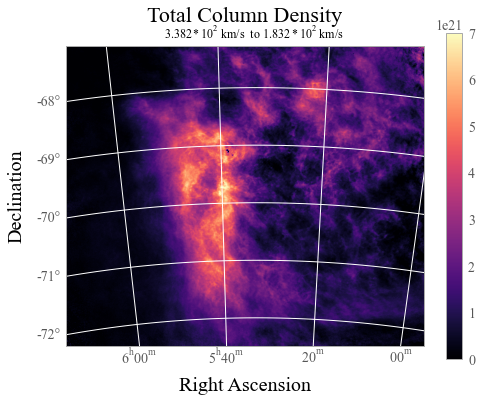

In [328]:
# column density over all the velocity ranges 

get_col_dens(file2, tot_col_dens2, 0,  0.7 * 10 ** 22, 'Total Column Density', '$\mathregular{3.382 * 10^{2}}$ km/s  to $\mathregular{1.832 * 10^{2}}$ km/s', False, 'LMC_cold_tot.png')


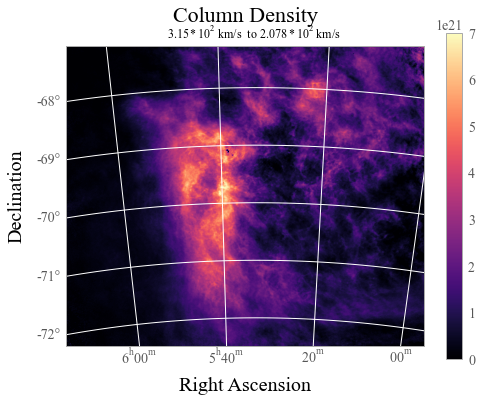

In [335]:
# column density over the range where HI clearly present
# ig it makes sense that it's the same plot as with total column density

indx21 = get_v_index2(3.15 * 10 ** 5)
indx22 = get_v_index2(2.078 * 10 ** 5)
col_dens21 = 1.82 * (10 ** 18) * np.sum(file2[0].data[indx21:indx22], axis = 0) * 0.244211877318

get_col_dens(file2, col_dens21, 0,  0.7 * 10 ** 22, 'Column Density', '$\mathregular{3.15 * 10^{2}}$ km/s  to $\mathregular{2.078 * 10^{2}}$ km/s', False, 'LMC_cold_tot.png')



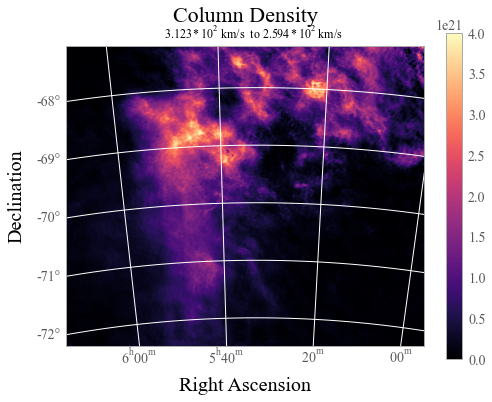

In [337]:
# column density over the range where structure enters and then coalesces into a circle in the middle 
# (beginning half-ish)

indx23 = get_v_index2(3.123 * 10 ** 5)
indx24 = get_v_index2(2.594 * 10 ** 5)
col_dens22 = 1.82 * (10 ** 18) * np.sum(file2[0].data[indx23:indx24], axis = 0) * 0.244211877318

get_col_dens(file2, col_dens22, 0,  0.4 * 10 ** 22, 'Column Density', '$\mathregular{3.123 * 10^{2}}$ km/s  to $\mathregular{2.594 * 10^{2}}$ km/s', False, 'LMC_cold_tot.png')


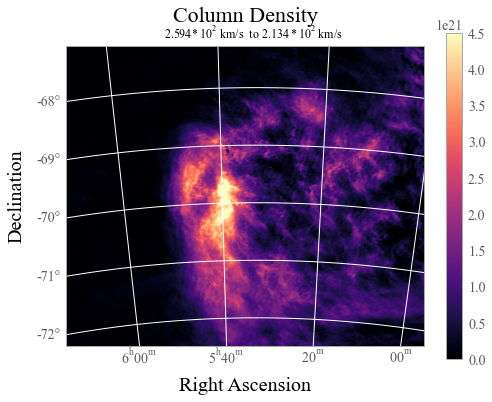

In [339]:
# column density over the range where structure is a circle in the middle to where it disappears in the bottom right
# (ending half-ish)

indx25 = get_v_index2(2.594 * 10 ** 5)
indx26 = get_v_index2(2.134 * 10 ** 5)
col_dens23 = 1.82 * (10 ** 18) * np.sum(file2[0].data[indx25:indx26], axis = 0) * 0.244211877318

get_col_dens(file2, col_dens23, 0,  0.45 * 10 ** 22, 'Column Density', '$\mathregular{2.594 * 10^{2}}$ km/s  to $\mathregular{2.134 * 10^{2}}$ km/s', False, 'LMC_cold_tot.png')


In [561]:
FUSE_data_nonMW = s_file[(s_file["Galaxy"] == 'LMC')]
print(FUSE_data_nonMW)

        Target     RA_FK5    DEC_FK5 Galaxy    SpecType      FUSE_ID Short_ID  \
0     Sk-69_94  79.560542 -69.250278    LMC     A0e/LBV  Z9050201000   z90502   
1    HDE269599  82.094500 -69.142281    LMC           B  E9570301000   e95703   
2      HD38489  85.055833 -69.379500    LMC          B0  E9570501000   e95705   
3     Sk-65.01  73.527583 -65.589583    LMC       B0-1I  A0490302000   a04903   
4        BI184  82.627500 -71.042022    LMC       B0.5V  P2170301000   p21703   
..         ...        ...        ...    ...         ...          ...      ...   
98      Brey26  80.593750 -71.599444    LMC         WN6  G9270601000   g92706   
99   SK-69D246  84.722917 -69.033528    LMC    WN6-A(B)  P1031802000   p10318   
100    HD33133  75.792500 -66.681667    LMC         WN8  P1174501000   p11745   
101  HDE269927  84.742708 -69.488639    LMC         WN9  P1174601000   p11746   
102   SK-68D82  81.688792 -68.831342    LMC  Wolf-Rayet  P2030101000   p20301   

     log10_N_MW  
0     16.

In [563]:
file2_flat_hdr = make_flat_hdr(file2)

In [564]:
coords_col2 = coordinate_4_pix(file2_flat_hdr)

/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


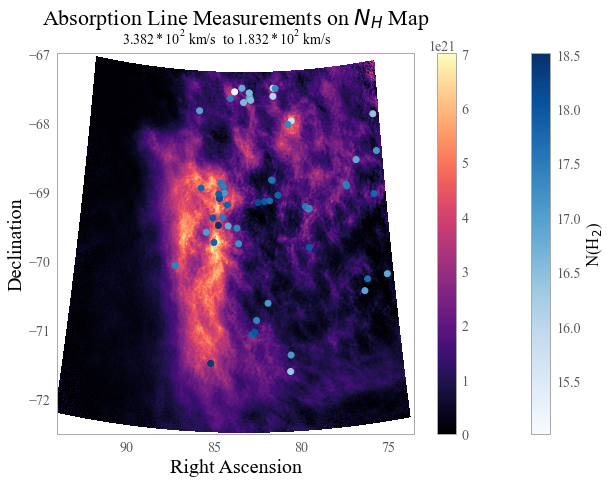

In [614]:
# plots abs line data atop of ALL data
# note that this graph is the column density graph but reflected over the y-axis

chan_map_abs_plt(coords_col2, tot_col_dens2, '$\mathregular{3.382 * 10^{2}}$ km/s  to $\mathregular{1.832 * 10^{2}}$ km/s', 0, 0.7 * 10 ** 22, 'Blues', False, 'testfig.png')


/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


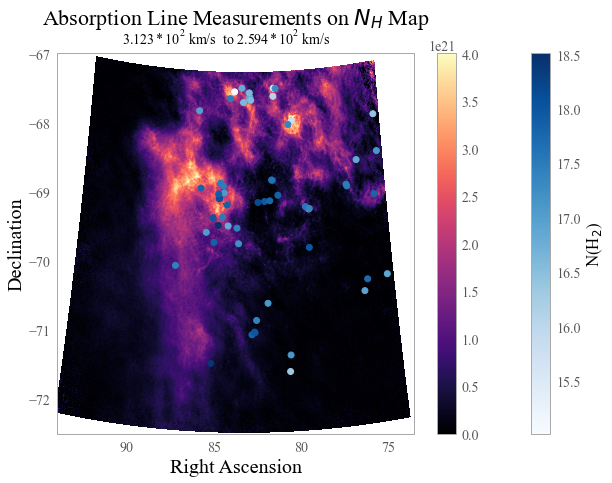

In [615]:
chan_map_abs_plt(coords_col2, col_dens22, '$\mathregular{3.123 * 10^{2}}$ km/s  to $\mathregular{2.594 * 10^{2}}$ km/s', 0, 0.4 * 10 ** 22, 'Blues', False, 'testfig.png')



/var/folders/xk/1lmd1p057bnc571tp2ws6_sc0000gp/T/ipykernel_8917/3534352924.py:4: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  image = plt.pcolormesh(coordinates[:, :, 0], coordinates[:, :, 1], cube, vmin = vmin_val , vmax = vmax_val, shading = 'auto', cmap = 'magma', zorder = -100)


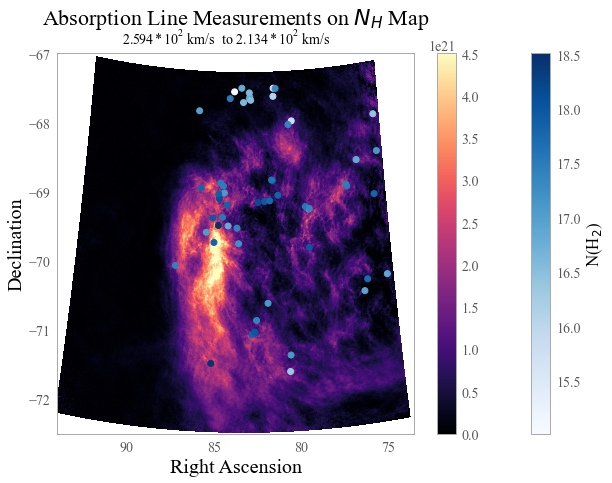

In [616]:
chan_map_abs_plt(coords_col2, col_dens23, '$\mathregular{2.594 * 10^{2}}$ km/s  to $\mathregular{2.134 * 10^{2}}$ km/s', 0, 0.45 * 10 ** 22, 'Blues', False, 'testfig.png')


